In [49]:
# %pip install altair
# %pip install WordNet
# %pip install gensim
# %pip install nltk
# import nltk
# nltk.download('omw-1.4')
# nltk.download('wordnet')
# %pip install matplotlib
# %pip install wordcloud
# %pip install spacy
# %pip install Gensim
# %python -m spacy download en_core_web_sm
# %pip install pandas

In [2]:
import pandas as pd
from nltk import WordNetLemmatizer
import gensim
import re
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import altair as alt
import spacy
import gensim
from gensim import corpora
from pprint import pprint
import json
from collections import Counter
from matplotlib import pyplot as plt
alt.data_transformers.disable_max_rows()

DataTransformerRegistry.enable('default')

In [2]:
nlp = spacy.load('en_core_web_sm')

In [16]:
df = pd.read_csv(r"C:\Users\Administrator\Downloads\parler-hate-speech-main\parler-hate-speech-main\parler_annotated_data.csv")

In [4]:
df = pd.read_json(r"data/parler_data000000000000.ndjson", lines=True)

In [5]:
sample = df.sample(1000)
sample

,comments,body,bodywithurls,createdAt,createdAtformatted,creator,datatype,depth,depthRaw,followers,...,shareLink,color,commentDepth,controversy,conversation,downvotes,post,replyingTo,score,isPrimary
1076631,1,@S1alameri ماعليك عطيته احلاا بلوكك,@S1alameri ماعليك عطيته احلاا بلوكك\n,2.019063e+13,2019-06-26 16:20:03 UTC,5692d6b045794687b803d297b653d669,comments,3.0,3.0,342.0,...,https://parler.com/comment/a2a681b550f94e948a6...,#5dba1f,1.0,0.0,fb62bc90fc514a618d6735dddc865a77,0.0,dee3d403e9954e5893c94924184fd1b0,a6cd65489b6545f4a585b1cbb1443146,0.0,NaN
1007911,2,,\n,2.020102e+13,2020-10-17 19:47:54 UTC,3b4f4a7a6dae40cc970e317f0a0589df,posts,1.0,1.0,4800.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
879749,0,😂😂😂,😂😂😂\n,2.020080e+13,2020-08-03 02:54:26 UTC,4b355d0dea794102bcce4c79c6cf2917,comments,1.0,1.0,1400.0,...,https://parler.com/comment/62d507eff71349b4a15...,#a60303,0.0,0.0,NaN,0.0,954970e0ee7a43869207303fff18e601,NaN,0.0,1.0
427453,-1,,\n,2.020111e+13,2020-11-11 13:27:51 UTC,a5820fa1dfee4b338ceb3b3e72d4af37,posts,1.0,1.0,427.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
858173,0,Sounds like it,Sounds like it\n,2.020083e+13,2020-08-27 00:00:28 UTC,9c76aef406724099996737b6334c79d0,comments,1.0,1.0,3200.0,...,https://parler.com/comment/88ed7f08cdd94c348e9...,#a60303,0.0,0.0,NaN,0.0,c0e427d91b1349d4983edffae2534c52,NaN,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
982874,-1,,\n,2.019071e+13,2019-07-12 00:43:12 UTC,f023f6a6cea74d6db6ac521ac1dd2323,posts,1.0,1.0,315.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
569325,7800,,\n,2.020112e+13,2020-11-22 17:53:34 UTC,1c04b2a03df84447a02e002b2ecc9baf,posts,1.0,1.0,62.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
568270,245,,\n,2.020111e+13,2020-11-10 14:41:57 UTC,817b4fa7e83a4ce39835ae738e08064d,posts,1.0,1.0,132.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
87657,1,WATCH: NJ Gym Owner Defies Gov's Unconstitutio...,WATCH: NJ Gym Owner Defies Gov's Unconstitutio...,2.020073e+13,2020-07-27 20:37:46 UTC,bfd91722646040c7a9b9d8cf1a8f6e0d,posts,0.0,0.0,2100.0,...,https://parler.com/post/9eee182bc0a943bd91fc5d...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
def lemmatize(token):
    return WordNetLemmatizer().lemmatize(token, pos='v')

def tokenize(tweet):
    result = []
    for token in gensim.utils.simple_preprocess(tweet):
        if token not in gensim.parsing.preprocessing.STOPWORDS and len(token) > 2:
            result.append(lemmatize(token))
    res = ' '.join(result)
    return res

def preprocess(tweet):
    result = re.sub(r'(RT\s@[A-Za-z]+[A-Za-z0-9-_]+)', '', tweet)
    result = re.sub(r'(@[A-Za-z0-9-_]+)', '', result)
    result = re.sub(r'http\S+', '', result)
    result = re.sub(r'bit.ly/\S+', '', result)
    result = re.sub(r'(.)\1+', r'\1\1', result)
    result = " ".join(re.findall('[A-Z][^A-Z]*', result)) 
    result = re.sub(r'&[\S]+?;', '', result)
    result = re.sub(r'#', ' ', result)
    result = re.sub(r'[^\w\s]', r'', result)    
    result = re.sub(r'\w*\d\w*', r'', result)
    result = re.sub(r'\s\s+', ' ', result)
    result = re.sub(r'(\A\s+|\s+\Z)', '', result)
    result = tokenize(result)
    return result

def wordcloud(txt):
    mask = np.array(Image.open(r'data/Parler-Logo.wine.png'))    
    wc = WordCloud(mode="RGBA", max_words=5000, background_color="white", colormap="magma", mask=mask,
                   stopwords=STOPWORDS.union({"people", "new", "say", "america", "american", "want", "go"}), max_font_size=500, random_state=42)

    wc.generate(txt)
    # show
    fig, axes = plt.subplots(1, 1)
    axes.imshow(wc, interpolation="bilinear")
    fig.set_figheight(20)
    fig.set_figwidth(20)
    axes.set_axis_off()
    plt.show()

In [18]:
df["new_text"] = df["text"].apply(preprocess)

In [19]:
df

,id,text,label_mean,disputable_post,new_text
0,a113a2d777ca4211ae97a193eee44dc1,Black men are taught that a word justifies all...,3.60,True,black men teach word justify form violence whi...
1,bb348c5f20a84be1bc3467d32312341c,Biden and his supporters are claiming that Bid...,4.00,True,biden supporters claim biden bring country bri...
2,39df38e04a44423f93ba1d1dc79070c9,Pelosi; âOne way or another Joe Biden will b...,1.25,False,pelosi way joe biden presidentâ
3,68dd325894274be79f73767e92e64702,Northern California Declares Independence From...,3.00,True,northern california declare independence china...
4,9503e349140b4bbe9e496f4c0f15f830,Whistleblower claims top DHS officials sought ...,1.50,False,whistleblower claim officials seek alter intel...
...,...,...,...,...,...
10116,bd2e05ec9a7942b78fbedab3d75d1079,Minneapolis City Council Votes To Eliminate Po...,1.00,False,minneapolis city council vote eliminate police...
10117,23ce3d9f0f09448abe4665b93dab2aef,And just like that facebook is gone,1.00,False,like facebook go
10118,163f0fad195c4cb58ef31920921a1ab9,Obama Says He Will Campaign For Biden If He Ca...,1.00,False,obama say campaign biden work busy memoir writ...
10119,ca70cdcc29084720990fc21ca6a3e31d,Shoup Voting Machine,1.00,False,shoup vote machine


<AxesSubplot: >

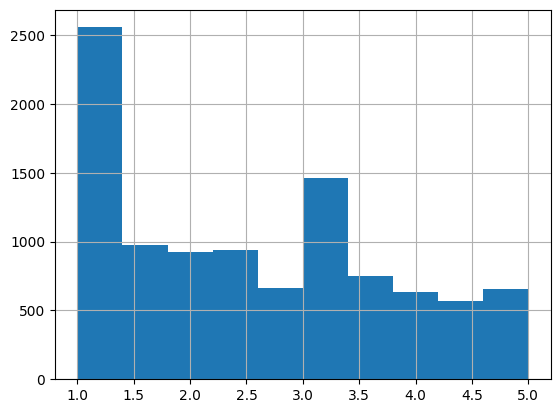

In [20]:
df["label_mean"].hist()

In [21]:
for score in range(1,6, 2):
    print(score)
    wordcloud(' '.join(df[(score<=df["label_mean"])&(df["label_mean"]<score+1)]["new_text"].values.ravel()))

1


KeyboardInterrupt: 

In [22]:
df["ent"] = df['text'].apply(lambda x: list(nlp(x).ents))
df

,id,text,label_mean,disputable_post,new_text,ent
0,a113a2d777ca4211ae97a193eee44dc1,Black men are taught that a word justifies all...,3.60,True,black men teach word justify form violence whi...,[]
1,bb348c5f20a84be1bc3467d32312341c,Biden and his supporters are claiming that Bid...,4.00,True,biden supporters claim biden bring country bri...,"[(Biden), (Biden), (Biden), (American), (Biden)]"
2,39df38e04a44423f93ba1d1dc79070c9,Pelosi; âOne way or another Joe Biden will b...,1.25,False,pelosi way joe biden presidentâ,"[(Joe, Biden)]"
3,68dd325894274be79f73767e92e64702,Northern California Declares Independence From...,3.00,True,northern california declare independence china...,"[(Northern, California, Declares, Independence..."
4,9503e349140b4bbe9e496f4c0f15f830,Whistleblower claims top DHS officials sought ...,1.50,False,whistleblower claim officials seek alter intel...,"[(DHS), (Trump)]"
...,...,...,...,...,...,...
10116,bd2e05ec9a7942b78fbedab3d75d1079,Minneapolis City Council Votes To Eliminate Po...,1.00,False,minneapolis city council vote eliminate police...,"[(Minneapolis, City, Council, Votes, To, Elimi..."
10117,23ce3d9f0f09448abe4665b93dab2aef,And just like that facebook is gone,1.00,False,like facebook go,[]
10118,163f0fad195c4cb58ef31920921a1ab9,Obama Says He Will Campaign For Biden If He Ca...,1.00,False,obama say campaign biden work busy memoir writ...,"[(Obama), (He, Can, Work, It, Into, His, Busy,..."
10119,ca70cdcc29084720990fc21ca6a3e31d,Shoup Voting Machine,1.00,False,shoup vote machine,[]


In [23]:
df["text_len"] = df.text.str.len()

df


,id,text,label_mean,disputable_post,new_text,ent,text_len
0,a113a2d777ca4211ae97a193eee44dc1,Black men are taught that a word justifies all...,3.60,True,black men teach word justify form violence whi...,[],86
1,bb348c5f20a84be1bc3467d32312341c,Biden and his supporters are claiming that Bid...,4.00,True,biden supporters claim biden bring country bri...,"[(Biden), (Biden), (Biden), (American), (Biden)]",514
2,39df38e04a44423f93ba1d1dc79070c9,Pelosi; âOne way or another Joe Biden will b...,1.25,False,pelosi way joe biden presidentâ,"[(Joe, Biden)]",61
3,68dd325894274be79f73767e92e64702,Northern California Declares Independence From...,3.00,True,northern california declare independence china...,"[(Northern, California, Declares, Independence...",178
4,9503e349140b4bbe9e496f4c0f15f830,Whistleblower claims top DHS officials sought ...,1.50,False,whistleblower claim officials seek alter intel...,"[(DHS), (Trump)]",103
...,...,...,...,...,...,...,...
10116,bd2e05ec9a7942b78fbedab3d75d1079,Minneapolis City Council Votes To Eliminate Po...,1.00,False,minneapolis city council vote eliminate police...,"[(Minneapolis, City, Council, Votes, To, Elimi...",79
10117,23ce3d9f0f09448abe4665b93dab2aef,And just like that facebook is gone,1.00,False,like facebook go,[],35
10118,163f0fad195c4cb58ef31920921a1ab9,Obama Says He Will Campaign For Biden If He Ca...,1.00,False,obama say campaign biden work busy memoir writ...,"[(Obama), (He, Can, Work, It, Into, His, Busy,...",111
10119,ca70cdcc29084720990fc21ca6a3e31d,Shoup Voting Machine,1.00,False,shoup vote machine,[],20


In [24]:
# df["text_len"] = df.text.str.len()
alt.Chart(df.drop("ent",axis=1)).mark_bar().encode(alt.X("text_len:Q"), y='mean(label_mean):Q')

c:\Users\Administrator\Repositories\GreenSecurity-FirstExperiment\.conda\lib\site-packages\altair\utils\core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

In [25]:
df.dtypes

id                  object
text                object
label_mean         float64
disputable_post       bool
new_text            object
ent                 object
text_len             int64
dtype: object

In [26]:
df[df.label_mean>3]

,id,text,label_mean,disputable_post,new_text,ent,text_len
0,a113a2d777ca4211ae97a193eee44dc1,Black men are taught that a word justifies all...,3.6,True,black men teach word justify form violence whi...,[],86
1,bb348c5f20a84be1bc3467d32312341c,Biden and his supporters are claiming that Bid...,4.0,True,biden supporters claim biden bring country bri...,"[(Biden), (Biden), (Biden), (American), (Biden)]",514
5,61b45f2913bd44a8956ee87cc651cd40,ð´â ï¸â ï¸â ï¸â ï¸â ï¸â ï¸â ï¸...,4.4,False,,"[(ANYONE), (SHUT, THE)]",400
6,141482eeee684715a2f94aa8240b79bb,Black Chairman of Proud Boys Speaks Out after ...,3.8,False,black chairman proud boys speak liars joe bide...,"[(Liars, Joe, Biden), (Chris, Wallace)]",108
7,3901049ac6e24ec6949eefa303f84fba,This country is beyond f*cked. The President h...,3.6,True,country fcked president diddle issue take offi...,[(U.S.)],225
...,...,...,...,...,...,...,...
10070,dc2f792a722147ffa64eedaf28d3a127,Iâll bet she grabs the son of a bitch by his...,3.5,False,iâll bet grab son bitch lop ears corn hole scu...,[],97
10075,97a56ba9e24b45fbb8315328650ce14f,We need the Salem Witch Hunt s brought back to...,4.5,False,need salem witch hunt bring life burn satanist...,[(Salem)],137
10076,c5c537ef59934b26a862b3bd3c40da3e,Hey another unsuitable Mom just killed a baby ...,3.5,False,hey unsuitable mom kill baby abortion think ri...,[],124
10082,db3fb92761d34a96afa7a2203885e853,Raphael Warnock: âOpen Up the Jail Cellsâ;...,3.5,False,raphael warnock open jail cellsâ call creation...,"[(Raphael, Warnock), (Jail), (EVIL)]",143


In [27]:
text_tokens = [[text for text in doc.split()] for doc in df.new_text.values]
dict_LoS = corpora.Dictionary(text_tokens)
print(dict_LoS)


Dictionary<17892 unique tokens: ['black', 'form', 'justify', 'men', 'people']...>


In [28]:
minority_group=['muslim','african', 'black', 'gay', 'lesbian', 'jewish', 'asian', 'white', 'democrate', 'republican', 'women', 'china']

In [29]:
df['target'] = ["None"]*df.text.shape[0]
for i, doc in df.iterrows():
    for group in minority_group:
        if doc.new_text.__contains__(group):
            if df['target'].iloc[i] == "None":
                df['target'].iloc[i] = group
            else:
                df['target'].iloc[i] = 'ambiguous'
        

C:\Users\Administrator\AppData\Local\Temp\ipykernel_25428\1542920719.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target'].iloc[i] = group
C:\Users\Administrator\AppData\Local\Temp\ipykernel_25428\1542920719.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['target'].iloc[i] = 'ambiguous'


<AxesSubplot: >

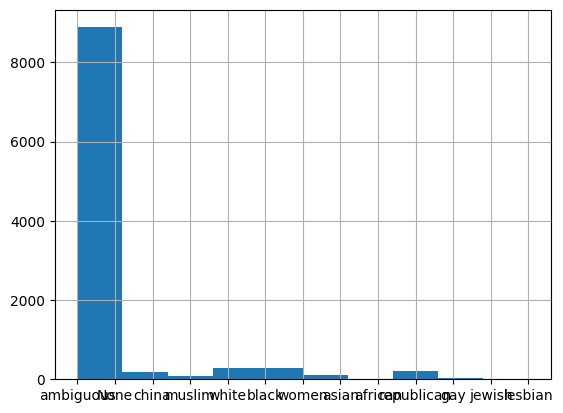

In [30]:
df.target.hist()

In [31]:
alt.Chart(df.drop(df[df['target']=="None"].index).drop("ent",axis=1)).mark_bar().encode(
    alt.X("target:N"), y='count():Q', color='mean(label_mean)')

c:\Users\Administrator\Repositories\GreenSecurity-FirstExperiment\.conda\lib\site-packages\altair\utils\core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)

In [ ]:
df[df['target']=='gay']

,id,text,label_mean,disputable_post,new_text,ent,text_len,target
482,390b7a8d49a04f09afff8720dcb4814e,Liberal gay intolerance on display,1.666667,False,liberal gay intolerance display,[],34,gay
528,01fb413591b241b6a4686306770a33ee,It's like a Twitter textpost except I won't ge...,3.666667,False,like twitter textpost wont cancel say gays dis...,[(Twitter)],89,gay
1124,f6ec879e4a6540d2b4360fa0a999187b,"Damn! If the democrats best is Biden, Warren a...",4.333334,False,damn democrats best biden warren buttplug they...,"[(democrats), (Biden), (Warren), (Buttplug), (...",396,gay
1486,543ab19ea48042bbb1768c4db840e536,When are the #gays gonna protest about not hav...,3.000000,False,gays gonna protest have gloves box buy hairdye...,"[(#, gays)]",117,gay
1493,18b98ccd9d5a49c4baca2635f9c68a9c,Fr. Altman has been silenced!\n\nHis Bishop no...,2.333333,False,altman silence bishop longer allow stream chur...,"[(Altman), (Bishop), (Fr), (James, Martin), (D...",384,gay
1494,d5aa2e874f53471e99f31970ed1126a9,These notifications are so fucking gay. I donâ...,3.666667,True,notifications fuck gay donât want post notifs ...,[],99,gay
1550,873e3b9536ae44799460f7c06947f3b1,So....I piss people off...was talking to someo...,3.666667,True,piss people offwas talk dude gotcaught fuck ra...,"[(Idid), (0), (Dip), (Dip), (Dip)]",691,gay
1572,a2b841029cba4e3994ac2dfc0af6fd55,\nThis piece of shit is something else....\nFk...,4.333334,False,piece shit fking douchbag comey lovers gay com...,"[(Comey), (Douchbag)]",189,gay
1736,d9b6a2d10f9645929ea6c6c7c1c64823,More pedo shit and I'm sure a comrade hike is ...,3.666667,False,pedo shit sure comrade hike code gay orgy woods,[],78,gay
2146,8e025af6872f49768409a52dcb82f650,How homophobes thing being gay works \n\n{{__/...,3.000000,False,homophobes thing gay work hereâs daily dose ga...,"[(Hereâs), (daily), (today)]",169,gay


In [3]:
with open(r"data/dataset.json", 'r') as f:
    d = json.load(f)
d

{'1179055004553900032_twitter': {'post_id': '1179055004553900032_twitter',
  'annotators': [{'label': 'normal', 'annotator_id': 1, 'target': ['None']},
   {'label': 'normal', 'annotator_id': 2, 'target': ['None']},
   {'label': 'normal', 'annotator_id': 3, 'target': ['None']}],
  'rationales': [],
  'post_tokens': ['i',
   'dont',
   'think',
   'im',
   'getting',
   'my',
   'baby',
   'them',
   'white',
   '9',
   'he',
   'has',
   'two',
   'white',
   'j',
   'and',
   'nikes',
   'not',
   'even',
   'touched']},
 '1179063826874032128_twitter': {'post_id': '1179063826874032128_twitter',
  'annotators': [{'label': 'normal', 'annotator_id': 1, 'target': ['None']},
   {'label': 'normal', 'annotator_id': 2, 'target': ['None']},
   {'label': 'normal', 'annotator_id': 3, 'target': ['None']}],
  'rationales': [],
  'post_tokens': ['we',
   'cannot',
   'continue',
   'calling',
   'ourselves',
   'feminists',
   'if',
   'the',
   'rights',
   'of',
   'all',
   'womxn',
   'arent',
 

(array([1.3449e+04, 4.8870e+03, 8.5700e+02, 7.0000e+02, 1.2300e+02,
        7.8000e+01, 3.1000e+01, 1.1000e+01, 6.0000e+00, 6.0000e+00]),
 array([0.66666667, 1.2       , 1.73333333, 2.26666667, 2.8       ,
        3.33333333, 3.86666667, 4.4       , 4.93333333, 5.46666667,
        6.        ]),
 <BarContainer object of 10 artists>)

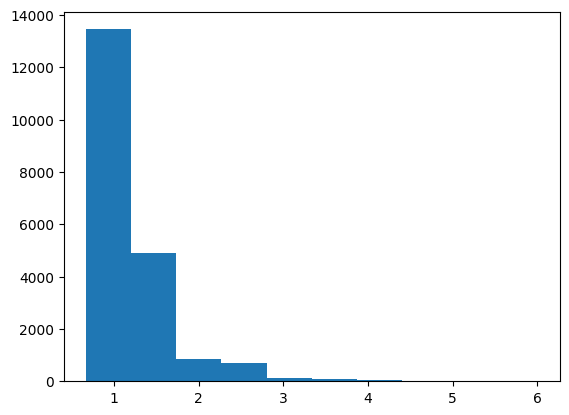

In [4]:
k_lst = []
for i in d:
    k = 0
    for annot in d[i]["annotators"]:
        k += len(annot['target'])
    k /=3
    k_lst.append(k)
plt.hist(k_lst)

In [187]:
def annotators_finall(doc):
    label_counter = Counter(anot['label'] for anot in doc['annotators'])
    possible_label = []
    for anot in doc["annotators"]:
        print(anot)
        possible_label.extend(anot["target"])
    # target_counter = Counter(Counter(anot['target']).most_common(1)[0][0] if anot['target'] else 'None'  for anot in doc['annotators'])
    majority_label = label_counter.most_common(1)[0][0] 
    if not possible_label:
        majority_target = "None"
    else:
        possible_label_counter = Counter(possible_label)
        print(possible_label_counter.most_common(1))

        if len(possible_label_counter.most_common(1))>1 and possible_label_counter.most_common(1)[0][1] == possible_label_counter.most_common(2)[1][1]:
            majority_target = "Ambiguouse"
        else:
            majority_target = possible_label_counter.most_common(1)[0][0]
    return majority_label, majority_target


In [188]:
dff = []
for id in d:
    majority_label, majority_target = annotators_finall(d[id])
        
    curr_doc = {'post_tokens':d[id]['post_tokens'],
                'hate_label':majority_label,
                'target': majority_target}
    dff.append(curr_doc)
dff = pd.DataFrame(dff)

{'label': 'normal', 'annotator_id': 1, 'target': ['None']}
{'label': 'normal', 'annotator_id': 2, 'target': ['None']}
{'label': 'normal', 'annotator_id': 3, 'target': ['None']}
[('None', 3)]
{'label': 'normal', 'annotator_id': 1, 'target': ['None']}
{'label': 'normal', 'annotator_id': 2, 'target': ['None']}
{'label': 'normal', 'annotator_id': 3, 'target': ['None']}
[('None', 3)]
{'label': 'normal', 'annotator_id': 4, 'target': ['African']}
{'label': 'normal', 'annotator_id': 2, 'target': ['None']}
{'label': 'hatespeech', 'annotator_id': 3, 'target': ['African']}
[('African', 2)]
{'label': 'hatespeech', 'annotator_id': 1, 'target': ['Asian']}
{'label': 'offensive', 'annotator_id': 4, 'target': ['Asian']}
{'label': 'hatespeech', 'annotator_id': 3, 'target': ['Asian']}
[('Asian', 3)]
{'label': 'hatespeech', 'annotator_id': 4, 'target': ['Caucasian', 'Women']}
{'label': 'hatespeech', 'annotator_id': 2, 'target': ['Women', 'Caucasian']}
{'label': 'offensive', 'annotator_id': 3, 'target': ['

<AxesSubplot: >

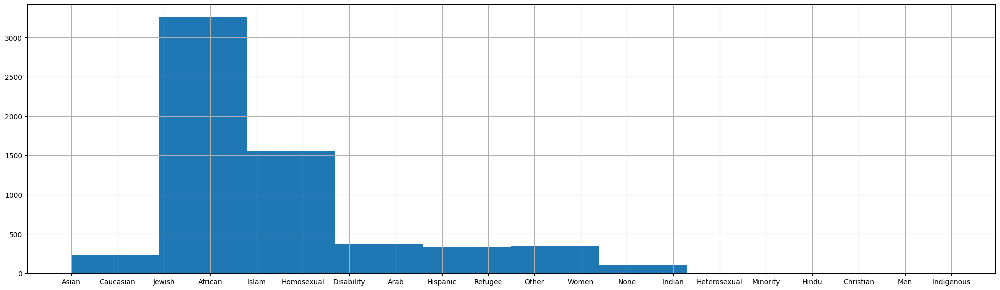

In [189]:
dff[dff["hate_label"] == "hatespeech"]["target"].hist(figsize=(25,7))

In [190]:
dff[dff["hate_label"] == "hatespeech"]

,post_tokens,hate_label,target
3,"[<user>, i, am, bit, confused, coz, chinese, p...",hatespeech,Asian
4,"[this, bitch, in, whataburger, eating, a, burg...",hatespeech,Caucasian
5,"[laura, loomer, raped, me, while, screaming, a...",hatespeech,Jewish
6,"[and, this, is, why, i, end, up, with, nigger,...",hatespeech,African
8,"[guilty, until, proven, innocent, unless, you,...",hatespeech,African
...,...,...,...
20128,"[well, my, dear, lgbtq, brothers, and, sisters...",hatespeech,Islam
20134,"[c, mon, men, charge, it, for, the, gays, tran...",hatespeech,African
20138,"[<user>, congrats, on, making, the, kike, hate...",hatespeech,Jewish
20140,"[more, and, more, leftists, are, moving, close...",hatespeech,Arab


In [191]:
len(dff.target.unique())

22

In [129]:
ent_dict = {}
for i, row in df.iterrows():
    ent = row['ent']
    for e in ent:
        e = str(e).lower()
        if e not in ent_dict.keys():
            ent_dict[e] = {'count':0, 'hate':0}
        ent_dict[e]['count'] += 1
        ent_dict[e]['hate'] += df.iloc[i].label_mean

In [117]:
ent_dict

{'biden': [378, 1169.7333347000003],
 'american': [319, 912.4333320000003],
 'joe biden': [219, 615.0666676000002],
 'northern california declares independence': [1, 3.0],
 'china': [189, 560.8333355999999],
 'state': [31, 109.16666660000001],
 'dhs': [6, 15.5],
 'trump': [774, 2119.0333335000023],
 'anyone': [15, 41.733333300000005],
 'shut the': [1, 4.4],
 'liars joe biden': [1, 3.8],
 'chris wallace': [28, 98.96666720000002],
 'u.s.': [58, 148.93333320000005],
 'democrats': [664, 2061.3000017000013],
 '#': [441, 1188.7333332],
 'ð\x9f\x96\x95off': [1, 3.75],
 'americans': [247, 702.6499997000006],
 'parl': [1, 3.25],
 'us': [213, 553.1499997999999],
 'kenya attack': [1, 1.25],
 'annual': [4, 9.75],
 'over 2 years': [1, 2.25],
 'uk': [47, 124.48333389999999],
 'at least': [2, 6.7333333],
 'two': [117, 323.80000119999994],
 'wendy williams': [1, 3.8],
 'europe': [14, 44.5833333],
 'globalism': [1, 1.25],
 'the democratic party: how aoc': [1, 2.25],
 'nancy pelosi': [37, 116.6833332],


In [157]:
ent_dict_df = pd.DataFrame(data=ent_dict.values(), columns=['count', 'hate'], index= ent_dict.keys()).reset_index()
ent_dict_df["mean_hate"] = ent_dict_df.hate/ent_dict_df['count']

alt.Chart(ent_dict_df[ent_dict_df["index"].isin(minority_group)]).mark_bar().encode(
    alt.X(field="index", title="target"), y='count:Q', color='mean_hate')

c:\Users\Administrator\Repositories\GreenSecurity-FirstExperiment\.conda\lib\site-packages\altair\utils\core.py:317: FutureWarning: iteritems is deprecated and will be removed in a future version. Use .items instead.
  for col_name, dtype in df.dtypes.iteritems():


alt.Chart(...)